## Installing the required libraries

In [17]:
!pip install opencv-python imgbeddings psycopg2-binary

In [18]:
!pip install deepface


## Step 1: Face recognition

Detect the faces from a sample picture and store them under the `stored-faces` folder

In [19]:
import cv2
import os
from deepface import DeepFace
dataset_dir = "/kaggle/input/marraige-photos-dataset/Marriage Photos"

# List all files in the dataset directory
all_images = os.listdir(dataset_dir)

# Sort the list of images alphabetically
all_images.sort()

# Select the path of the first image
first_image_path = os.path.join(dataset_dir, all_images[0])

print(first_image_path)

# Select the first 180 images
first_180_images = [os.path.join(dataset_dir, image) for image in all_images[:180]]

/kaggle/input/marraige-photos-dataset/Marriage Photos/4Y1A0001.JPG


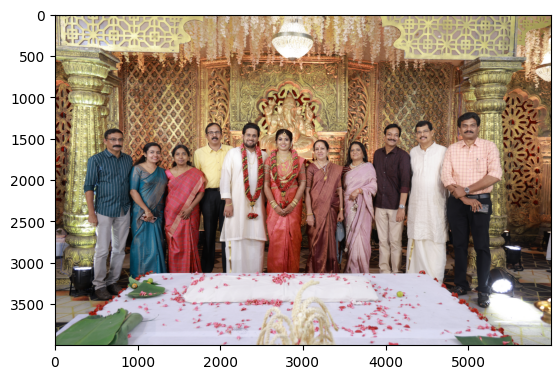

In [20]:
import cv2
import matplotlib.pyplot as plt
first_image = cv2.imread(first_image_path)
# Display the first image
plt.imshow(first_image[:,:,::-1])
plt.show()

In [21]:
rm -rf /kaggle/working/*

In [22]:
import os
dataset_dir = "/kaggle/input/marraige-photos-dataset/Marriage Photos"
output_dir_faces = "/kaggle/working/stored_faces"
output_dir_group_images = "/kaggle/working/group_images"


# Create the output directories if they don't exist
os.makedirs(output_dir_faces, exist_ok=True)
os.makedirs(output_dir_group_images, exist_ok=True)

In [23]:
# importing the cv2 library
#import cv2

# loading the haar cascade algorithm file into alg variable
#alg = "/kaggle/input/face-detection/haarcascade_frontalface_default.xml"
# passing the algorithm to OpenCV
#haar_cascade = cv2.CascadeClassifier(alg)
# loading the image path into file_name variable
#file_name = first_image_path
# reading the image
#img = cv2.imread(file_name)
# detecting the faces
#faces = haar_cascade.detectMultiScale(
#    img, scaleFactor=1.05, minNeighbors=2, minSize=(100, 100)
#)

#i = 0
# for each face detected
#for x, y, w, h in faces:
    # crop the image to select only the face
 #   cropped_image = img[y:y + h, x:x + w]
    # loading the target image path into target_file_name variable
 #   target_file_name = '/kaggle/working/stored_faces/' + str(i) + '.jpg'
  #  cv2.imwrite(
   #     target_file_name,
    #    cropped_image,
   # )
   # i = i + 1


In [24]:
backends = [
  'opencv', 
  'ssd', 
  'dlib', 
  'mtcnn', 
  'retinaface', 
  'mediapipe',
  'yolov8',
  'yunet',
  'fastmtcnn',
]

#face detection and alignment
face_objs = DeepFace.extract_faces(img_path = first_image_path,  
        detector_backend = backends[4]
)

In [25]:
print("There are", len(face_objs), "faces")

There are 11 faces


In [26]:
face_objs

[{'face': array([[[0.16470588, 0.15686275, 0.16862745],
          [0.16862745, 0.16078431, 0.17254902],
          [0.16862745, 0.16078431, 0.17254902],
          ...,
          [0.58823529, 0.38823529, 0.28235294],
          [0.59607843, 0.39215686, 0.29803922],
          [0.62745098, 0.42352941, 0.32941176]],
  
         [[0.16470588, 0.15686275, 0.16862745],
          [0.16470588, 0.15686275, 0.16862745],
          [0.15686275, 0.14901961, 0.16078431],
          ...,
          [0.58039216, 0.37647059, 0.28235294],
          [0.59215686, 0.38039216, 0.27843137],
          [0.62745098, 0.41568627, 0.31372549]],
  
         [[0.16470588, 0.15686275, 0.16862745],
          [0.15686275, 0.14901961, 0.16078431],
          [0.14901961, 0.14117647, 0.15294118],
          ...,
          [0.54901961, 0.35294118, 0.25490196],
          [0.56862745, 0.35686275, 0.25490196],
          [0.61960784, 0.40784314, 0.30588235]],
  
         ...,
  
         [[0.53333333, 0.39607843, 0.32156863],
      

In [27]:
import cv2
import os

# Assuming img is the original image
face_index = 0  # Initialize index for saving multiple faces
output_dir = '/kaggle/working/stored_faces'

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Iterate over each face object
for face_obj in face_objs:
    # Extract x, y, width, and height coordinates
    x = face_obj['facial_area']['x']
    y = face_obj['facial_area']['y']
    w = face_obj['facial_area']['w']
    h = face_obj['facial_area']['h']
    
    # Extract the face region from the original image
    face_region = cv2.imread(first_image_path)[y:y+h, x:x+w]
    
    # Save the extracted face region under the specified directory
    output_path = os.path.join(output_dir, 'face_{}.jpg'.format(face_index))
    cv2.imwrite(output_path, face_region)
    # Save the path of the image in the group images directory
    group_image_path = os.path.join(output_dir_group_images, f"face_{face_index}_group_image.txt")
    with open(group_image_path, 'w') as f:
        f.write(first_image_path)
    face_index += 1


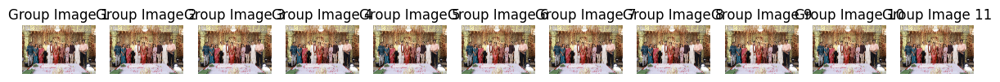

In [28]:
image_files = [f for f in os.listdir(output_dir_group_images) if f.endswith('.txt')]

fig, axes = plt.subplots(1, len(image_files), figsize=(15, 5))
for i, txt_file in enumerate(image_files):
    with open(os.path.join(output_dir_group_images, txt_file), 'r') as f:
        group_image_path = f.read().strip()
    group_image = cv2.cvtColor(cv2.imread(group_image_path), cv2.COLOR_BGR2RGB)
    axes[i].imshow(group_image)
    axes[i].axis('off')
    axes[i].set_title(f"Group Image {i+1}")

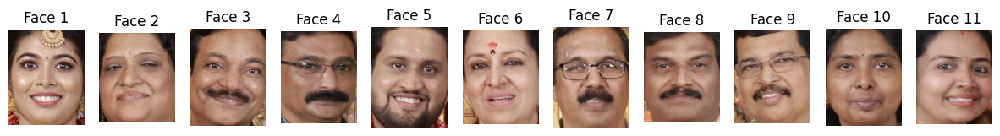

In [29]:
import matplotlib.pyplot as plt
import os

# Path to the directory where the images are saved
directory = "/kaggle/working/stored_faces/"

# Get the list of image files in the directory
image_files = [f for f in os.listdir(directory) if f.endswith('.jpg')]

# Plot each image
fig, axes = plt.subplots(1, len(image_files), figsize=(15, 5))
for i, image_file in enumerate(image_files):
    # Read the image file
    image_path = os.path.join(directory, image_file)
    image = plt.imread(image_path)

    # Display the image
    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(f"Face {i+1}")

plt.show()


## Trying out for the second image

In [31]:
second_image_path = os.path.join(dataset_dir,all_images[24])

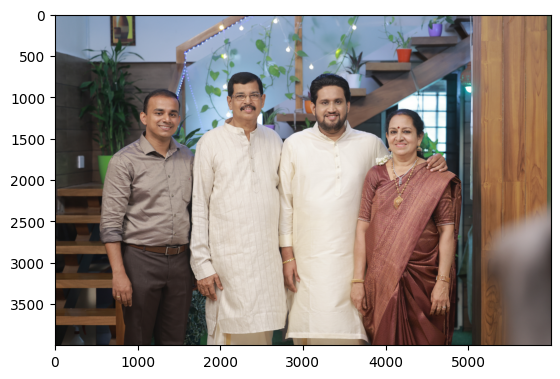

In [32]:
second_image = cv2.imread(second_image_path)
# Display the first image
plt.imshow(second_image[:,:,::-1])
plt.show()

In [35]:
#face detection and alignment
face_objs2 = DeepFace.extract_faces(img_path = second_image_path,  
        detector_backend = backends[4]
)
print("There are", len(face_objs2), "faces")
face_objs2

There are 4 faces


[{'face': array([[[0.16862745, 0.17254902, 0.18823529],
          [0.16862745, 0.17254902, 0.18039216],
          [0.17254902, 0.17647059, 0.18431373],
          ...,
          [0.16078431, 0.16078431, 0.19215686],
          [0.15294118, 0.15294118, 0.18431373],
          [0.14901961, 0.14901961, 0.18039216]],
  
         [[0.16470588, 0.16470588, 0.17254902],
          [0.16862745, 0.16862745, 0.17647059],
          [0.17254902, 0.17254902, 0.18039216],
          ...,
          [0.15686275, 0.15686275, 0.18823529],
          [0.14901961, 0.14901961, 0.18039216],
          [0.14117647, 0.14509804, 0.16470588]],
  
         [[0.17647059, 0.17647059, 0.18431373],
          [0.17647059, 0.17647059, 0.18431373],
          [0.16862745, 0.16862745, 0.17647059],
          ...,
          [0.15686275, 0.16078431, 0.18039216],
          [0.14509804, 0.14901961, 0.16862745],
          [0.14117647, 0.14509804, 0.16470588]],
  
         ...,
  
         [[0.68235294, 0.53333333, 0.45098039],
      

In [36]:
def compare_and_update_faces(face_image, group_image_path):
    for face_file in os.listdir(output_dir_faces):
        known_face = cv2.imread(os.path.join(output_dir_faces, face_file))
        match = DeepFace.verify(face_image, known_face)
        print(match)
        if match['verified']:
            # Update the corresponding txt file with the path of the group photo
            txt_file_path = os.path.join(output_dir_group_images, f"{os.path.splitext(face_file)[0]}_group_image.txt")
            with open(txt_file_path, 'a') as f:
                f.write(group_image_path + "\n")
            return True
    return False


In [37]:
import cv2
import os

temp_index = 0


# Iterate over each face object
for face_obj in face_objs2:
    # Extract x, y, width, and height coordinates
    x = face_obj['facial_area']['x']
    y = face_obj['facial_area']['y']
    w = face_obj['facial_area']['w']
    h = face_obj['facial_area']['h']
    
    # Extract the face region from the original image
    face_region = cv2.imread(second_image_path)[y:y+h, x:x+w]
    
    # Save the extracted face region under the specified directory
    output_path = os.path.join("/kaggle/working/", 'temp_{}.jpg'.format(temp_index))
    cv2.imwrite(output_path, face_region)
    temp_index += 1


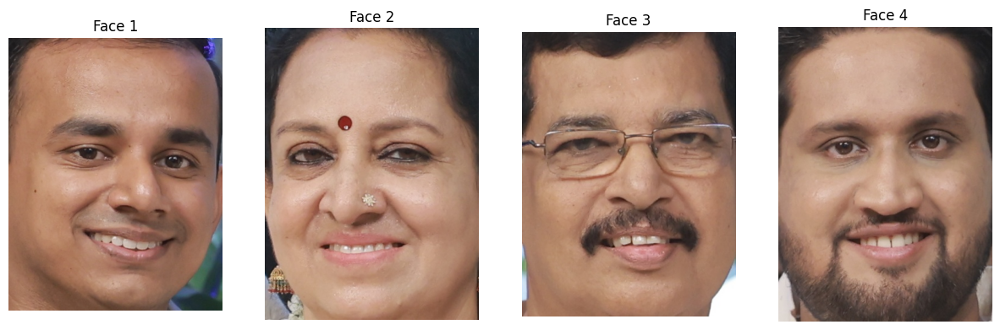

In [38]:
import matplotlib.pyplot as plt
import os

# Path to the directory where the images are saved
directory = "/kaggle/working/"

# Get the list of image files in the directory
image_files = [f for f in os.listdir(directory) if f.endswith('.jpg')]

# Plot each image
fig, axes = plt.subplots(1, len(image_files), figsize=(15, 5))
for i, image_file in enumerate(image_files):
    # Read the image file
    image_path = os.path.join(directory, image_file)
    image = plt.imread(image_path)

    # Display the image
    axes[i].imshow(image)
    axes[i].axis('off')
    axes[i].set_title(f"Face {i+1}")

plt.show()


In [40]:
def compare_and_update_faces(face_image, group_image_path):
    for face_file in os.listdir(output_dir_faces):
        known_face = cv2.imread(os.path.join(output_dir_faces, face_file))
        match = DeepFace.verify(img1_path = face_image, img2_path = known_face, enforce_detection = False)
        if match['distance'] < 0.24:
            # If the distance is below the threshold, consider it a match
            match['verified'] = True
        else:
            # If the distance is above the threshold, consider it not a match
            match['verified'] = False
        print(match['verified'])
        if match['verified']:
            # Update the corresponding txt file with the path of the group photo
            txt_file_path = os.path.join(output_dir_group_images, f"{os.path.splitext(face_file)[0]}_group_image.txt")
            with open(txt_file_path, 'a') as f:
                f.write("\n"+group_image_path)
            return True
    return False


In [41]:
result = DeepFace.verify(
    img1_path="/kaggle/working/temp_2.jpg",
    img2_path="/kaggle/working/stored_faces/face_1.jpg",
    enforce_detection=False
)

# Check if the distance is below the desired threshold
if result['distance'] < 0.24:
    # If the distance is below the threshold, consider it a match
    result['verified'] = True
else:
    # If the distance is above the threshold, consider it not a match
    result['verified'] = False

print(result)

24-04-25 20:51:37 - vgg_face_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/vgg_face_weights.h5
To: /root/.deepface/weights/vgg_face_weights.h5
100%|██████████| 580M/580M [00:01<00:00, 441MB/s] 


{'verified': True, 'distance': 0.17050137938416277, 'threshold': 0.68, 'model': 'VGG-Face', 'detector_backend': 'opencv', 'similarity_metric': 'cosine', 'facial_areas': {'img1': {'x': 0, 'y': 0, 'w': 372, 'h': 514, 'left_eye': None, 'right_eye': None}, 'img2': {'x': 0, 'y': 0, 'w': 167, 'h': 223, 'left_eye': None, 'right_eye': None}}, 'time': 4.51}


Similarity between /kaggle/working/temp_1.jpg and /kaggle/working/stored_faces/face_10.jpg: 0.17372940161932915


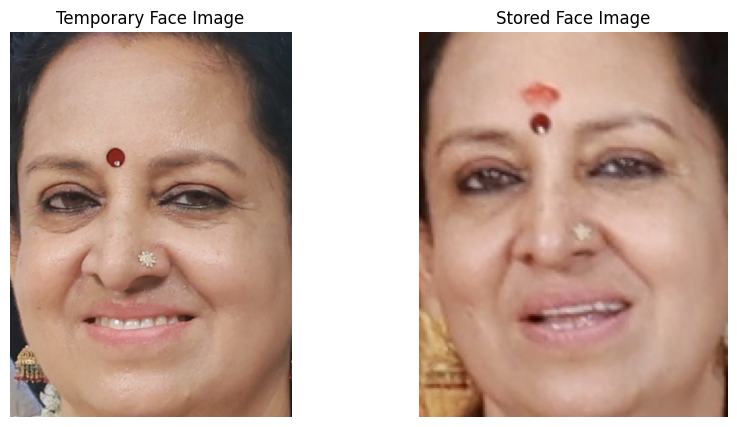

Similarity between /kaggle/working/temp_0.jpg and /kaggle/working/stored_faces/face_6.jpg: 0.17686744879225735


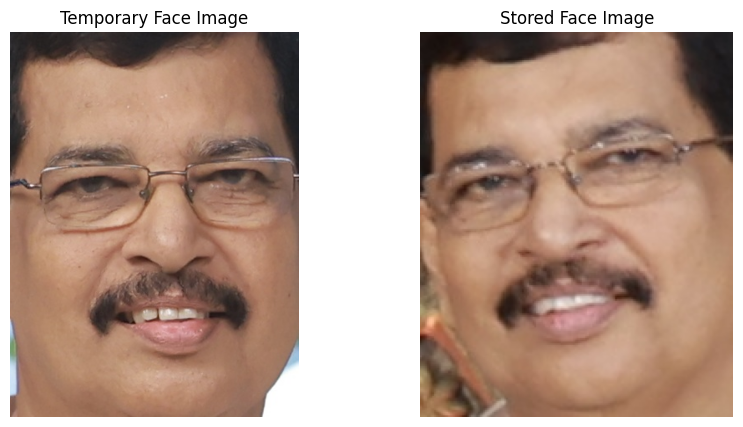

Similarity between /kaggle/working/temp_2.jpg and /kaggle/working/stored_faces/face_1.jpg: 0.17050137938416277


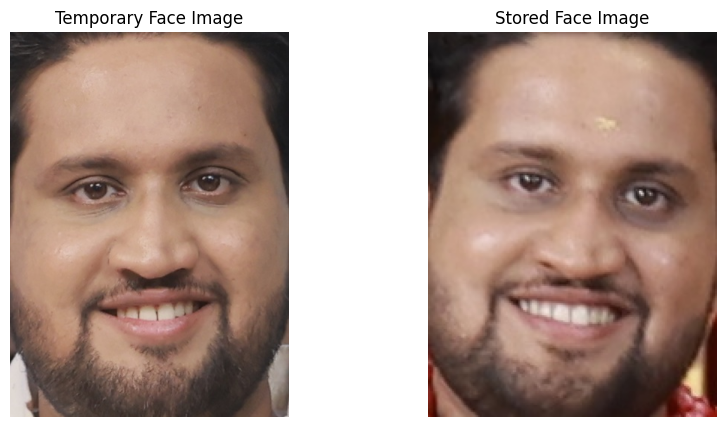

In [42]:
import matplotlib.pyplot as plt
import os

stored_faces_dir = "/kaggle/working/stored_faces"

# Iterate over each temporary face image
for temp_image_file in os.listdir("/kaggle/working"):
    if temp_image_file.startswith("temp_") and temp_image_file.endswith(".jpg"):
        temp_image_path = os.path.join("/kaggle/working", temp_image_file)
        
        # Iterate over each stored face image
        for stored_face_image_file in os.listdir(stored_faces_dir):
            stored_face_image_path = os.path.join(stored_faces_dir, stored_face_image_file)
            
            # Compare the temporary face image with the stored face image using DeepFace
            result = DeepFace.verify(img1_path = temp_image_path,img2_path = stored_face_image_path,enforce_detection=False)
            if result['distance'] < 0.24:
                # If the distance is below the threshold, consider it a match
                result['verified'] = True
            else:
                # If the distance is above the threshold, consider it not a match
                result['verified'] = False
            # Display the images and their similarity score if they are similar
            if result["verified"]:
                similarity_score = result["distance"]
                print(f"Similarity between {temp_image_path} and {stored_face_image_path}: {similarity_score}")
                
                # Load images for display
                temp_image = plt.imread(temp_image_path)
                stored_face_image = plt.imread(stored_face_image_path)
                
                # Display images
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                axes[0].imshow(temp_image)
                axes[0].axis('off')
                axes[0].set_title("Temporary Face Image")
                
                axes[1].imshow(stored_face_image)
                axes[1].axis('off')
                axes[1].set_title("Stored Face Image")
                
                plt.show()


In [43]:
# Define the path for the temporary file
temp_file_path = "/kaggle/working/temp.jpg"

for face_obj in face_objs2:
    x = face_obj['facial_area']['x']
    y = face_obj['facial_area']['y']
    w = face_obj['facial_area']['w']
    h = face_obj['facial_area']['h']

    # Extract the face region from the original image
    face_region = cv2.imread(second_image_path)[y:y+h, x:x+w]

    # Save the face region to the temporary file
    cv2.imwrite(temp_file_path, face_region)

    # Check if the face already exists in the faces directory
    if not compare_and_update_faces(temp_file_path, os.path.join(dataset_dir, second_image_path)):
        # Save the extracted face region under the faces directory
        output_path = os.path.join(output_dir_faces, 'face_{}.jpg'.format(face_index))
        cv2.imwrite(output_path, face_region)

        # Save the path of the image in the group images directory
        group_image_path = os.path.join(output_dir_group_images, f"face_{face_index}_group_image.txt")
        with open(group_image_path, 'w') as f:
            f.write(os.path.join(dataset_dir, second_image_path))

        face_index += 1

False
False
False
False
False
False
False
False
True
False
False
False
False
False
True
False
False
False
False
True
False
False
False
False
False
False
False
False
False
False
False


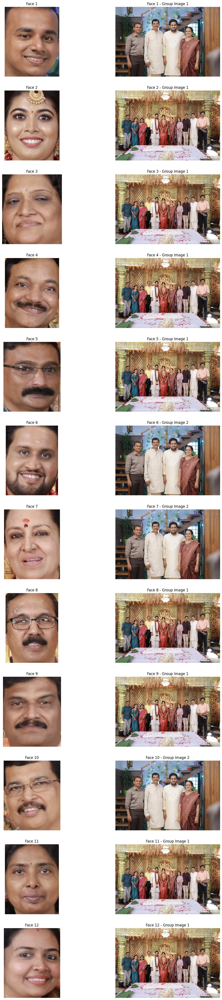

In [44]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

image_files = [f for f in os.listdir(output_dir_faces) if f.endswith('.jpg')]

fig, axes = plt.subplots(len(image_files), 2, figsize=(15, len(image_files)*5))
for i, image_file in enumerate(image_files):
    image_path = os.path.join(output_dir_faces, image_file)
    image = mpimg.imread(image_path)
    axes[i, 0].imshow(image)
    axes[i, 0].axis('off')
    axes[i, 0].set_title(f"Face {i+1}")

    # Read and display group images for each face
    txt_file_path = os.path.join(output_dir_group_images, f"{os.path.splitext(image_file)[0]}_group_image.txt")
    with open(txt_file_path, 'r') as f:
        group_image_paths = f.readlines()
        for j, group_image_path in enumerate(group_image_paths):
            group_image = mpimg.imread(group_image_path.strip())
            axes[i, 1].imshow(group_image)
            axes[i, 1].axis('off')
            axes[i, 1].set_title(f"Face {i+1} - Group Image {j+1}")

plt.show()


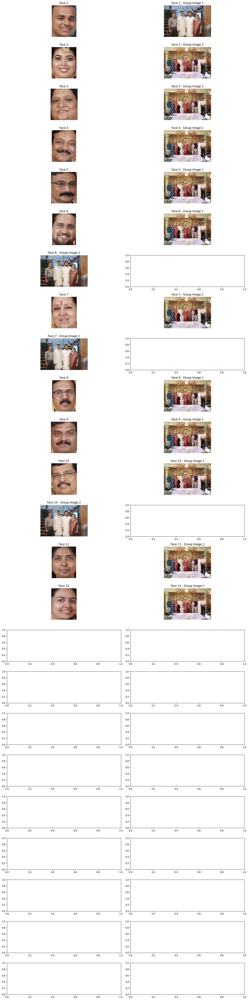

In [45]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

image_files = [f for f in os.listdir(output_dir_faces) if f.endswith('.jpg')]

fig_height = len(image_files) * 5
fig, axes = plt.subplots(len(image_files) * 2, 2, figsize=(15, fig_height))

row_index = 0

for i, image_file in enumerate(image_files):
    image_path = os.path.join(output_dir_faces, image_file)
    image = mpimg.imread(image_path)
    axes[row_index, 0].imshow(image)
    axes[row_index, 0].axis('off')
    axes[row_index, 0].set_title(f"Face {i+1}")

    # Read and display group images for each face
    txt_file_path = os.path.join(output_dir_group_images, f"{os.path.splitext(image_file)[0]}_group_image.txt")
    with open(txt_file_path, 'r') as f:
        group_image_paths = f.readlines()
        num_group_images = len(group_image_paths)
        group_image_index = 1
        for group_image_path in group_image_paths:
            if group_image_index < 2:
                axes[row_index, group_image_index].imshow(mpimg.imread(group_image_path.strip()))
                axes[row_index, group_image_index].axis('off')
                axes[row_index, group_image_index].set_title(f"Face {i+1} - Group Image {group_image_index}")
            else:
                axes[row_index+1, group_image_index%2].imshow(mpimg.imread(group_image_path.strip()))
                axes[row_index+1, group_image_index%2].axis('off')
                axes[row_index+1, group_image_index%2].set_title(f"Face {i+1} - Group Image {group_image_index}")
            group_image_index += 1
        
        if num_group_images > 1:
            row_index += int(num_group_images/2) + 1
        else:
            row_index += 1

plt.tight_layout()
plt.show()


## Doing for entire dataset

In [ ]:
import cv2
import os
from deepface import DeepFace

dataset_dir = "/kaggle/input/marriage-dataset-shortened/Shortened Marriage Dataset"

# Create output directories if they don't exist
output_dir_faces = "/kaggle/working/stored_faces"
output_dir_group_images = "/kaggle/working/group_images"
os.makedirs(output_dir_faces, exist_ok=True)
os.makedirs(output_dir_group_images, exist_ok=True)

backends = [
    'opencv', 
    'ssd', 
    'dlib', 
    'mtcnn', 
    'retinaface', 
    'mediapipe',
    'yolov8',
    'yunet',
    'fastmtcnn',
]

In [34]:
# Iterate over each image in the dataset
for image_name in os.listdir(dataset_dir):
    image_path = os.path.join(dataset_dir, image_name)
    
    # Extract faces from the current image
    face_objs = DeepFace.extract_faces(img_path=image_path, 
                                        target_size=(224, 224), 
                                        detector_backend=backends[4])
    
    print(f"Processing {image_name}: {len(face_objs)} faces found")
    
    # Process each detected face
    for face_index, face_obj in enumerate(face_objs):
        # Extract face region from the original image
        x, y, w, h = face_obj['facial_area']['x'], face_obj['facial_area']['y'], face_obj['facial_area']['w'], face_obj['facial_area']['h']
        face_region = cv2.imread(image_path)[y:y+h, x:x+w]
        
        # Save the extracted face region
        output_face_path = os.path.join(output_dir_faces, f"{image_name.split('.')[0]}_face_{face_index}.jpg")
        cv2.imwrite(output_face_path, face_region)
        
        # Save the path of the image in the group images directory
        group_image_path = os.path.join(output_dir_group_images, f"{image_name.split('.')[0]}_face_{face_index}_group_image.txt")
        with open(group_image_path, 'w') as f:
            f.write(image_path)

TypeError: extract_faces() got an unexpected keyword argument 'target_size'

In [ ]:
face_objs = DeepFace.extract_faces(img_path = first_image_path, 
        target_size = (224, 224), 
        detector_backend = backends[4]
)